# Mid/High-Frequency User Oriented Dataset - 3D UMAP
- UDD/MDS18/PP4
- Final Project: 'Studying Twitter User Accounts: Spotting Suspicious Social Bot Behavior'
- Master Candidate: Marcelo Rovai
- Professors:	   
    - Eduardo Graells-Garrido (Supervisor)
    - Loreto Bravo
    - Leo Ferres

## Main Libraries & Setup

In [184]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn.datasets import load_iris, load_digits
from sklearn.model_selection import train_test_split
import umap

In [2]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource, CategoricalColorMapper
from bokeh.palettes import Spectral10

output_notebook()

Loading BokehJS ...

In [186]:
import plotly
import plotly.express as px
import plotly.graph_objs as go

plotly.offline.init_notebook_mode()

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
pd.set_option('display.float_format', lambda x: '%.f' % x)
sns.set_context("paper",
                rc={
                    "font.size": 12,
                    "axes.titlesize": 12,
                    "axes.labelsize": 12,
                    'figure.figsize': (14, 10)
                })

## Main Functions

In [5]:
def plot_feature(df, feat, kde=True, prt=False, save_file_name=None, x_max = None):
    f, axes = plt.subplots(ncols=1, figsize=(10, 4))
    sns.despine(left=True)
    sns.distplot(df[feat],
                 color="m",
                 hist=False,
                 kde=kde,
                 kde_kws={
                     'shade': True,
                     'linewidth': 3
                 })
    plt.suptitle(feat + " distribution", fontsize=20)
    plt.xlabel(feat,fontsize=15)
    plt.setp(axes, yticks=[])
    plt.xlim(0, x_max)

    if prt == True:
        plt.savefig("../images/"+save_file_name, bbox_inches='tight')

In [6]:
def get_df_name(df):
    name =[x for x in globals() if globals()[x] is df][0]
    return name

In [1]:
def plot_feat_comp(df1,
                   df2,
                   feat,
                   color1='m',
                   color2='g',
                   prt=False,
                   x_max=None,
                  log=False):
    feat1 = df1[feat]
    feat2 = df2[feat]
    label_1 = get_df_name(df1)
    label_2 = get_df_name(df2)
    fig, axes = plt.subplots(ncols=1, figsize=(10, 5))

    #fig = plt.figure(figsize = (10,5))
    ax = sns.distplot(feat1,
                      color=color1,
                      label=label_1,
                      hist=False,
                      kde=True,
                      kde_kws={
                          'shade': True,
                          'linewidth': 3
                      })
    plt.xlim(x_max)
    if log:
        ax.set_xscale('log')
    
    ax = sns.distplot(feat2,
                      color=color2,
                      label=label_2,
                      hist=False,
                      kde=True,
                      kde_kws={
                          'shade': True,
                          'linewidth': 3
                      })
    plt.xlim(x_max)
    if log:
        ax.set_xscale('log')
    
    plt.suptitle(label_1 + "-" + label_2 + "  " + feat + ' distribution',
                 fontsize=16)
    sns.despine(left=True)
    plt.setp(axes, yticks=[])

    if prt == True:
        plt.savefig("../images/" + label_1 + "-" + label_2 + "-" + feat+'.png',
                    bbox_inches='tight')

In [2]:
def plot_feat_comp_2_graph(df1,
                           df2,
                           feat,
                           color1='m',
                           color2='g',
                           prt=False,
                           log=False):
    feat1 = df1[feat]
    feat2 = df2[feat]
    label_1 = get_df_name(df1)
    label_2 = get_df_name(df2)
    f, axes = plt.subplots(ncols=2, figsize=(10, 4))
    sns.despine(left=True)
    ax = sns.distplot(feat1,
                      color=color1,
                      label=label_1,
                      hist=False,
                      kde=True,
                      kde_kws={
                          'shade': True,
                          'linewidth': 3
                      },
                      ax=axes[0])

    if log:
        ax.set_xscale('log')

    ax = sns.distplot(feat2,
                      color=color2,
                      label=label_2,
                      hist=False,
                      kde=True,
                      kde_kws={
                          'shade': True,
                          'linewidth': 3
                      },
                      ax=axes[1])

    if log:
        ax.set_xscale('log')

    plt.suptitle(label_1 + "-" + label_2 + "  " + feat + " distribution",
                 fontsize=16)
    plt.setp(axes, yticks=[])

    if prt == True:
        plt.savefig("../images/" + label_1 + "-" + label_2 + "-" + feat+'.png',
                    bbox_inches='tight')

## Import Dataset

In [9]:
ls ../data/

20_tweets_nov_2017.csv             50_user_metrics_final.csv
30_tweets_nov_2017_final.csv       60_user_metrics_label.csv
40_user_metrics.csv                df_user_description.csv
45_user_adit_clean_metrics.csv     select_tweet_feat_description.csv


In [10]:
df = pd.read_csv("../data/60_user_metrics_label.csv", lineterminator='\n', low_memory=False)
df.shape

(91154, 34)

In [11]:
df.head(2)

,Unnamed: 0,user,default_prof_image,acc_verif,local_bol,default_profile,descr_bol,active_acc,tws_cnt,frs_cnt,...,mean_urls,mean_lenght,recent_age_days,user_name_len,name_len,user_name_len_num,simil_name,descr_len,fols_frs_ratio,label
0,0,T13,0,1,1,0,1,1,395044,111381,...,2,162,30,3,6,2,33,86,25,high_freq
1,1,nostromar,0,0,0,1,1,1,58290,3386,...,0,131,29,9,15,0,38,140,1,low_freq


In [12]:
del df['Unnamed: 0']

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91154 entries, 0 to 91153
Data columns (total 33 columns):
user                   91154 non-null object
default_prof_image     91154 non-null int64
acc_verif              91154 non-null int64
local_bol              91154 non-null int64
default_profile        91154 non-null int64
descr_bol              91154 non-null int64
active_acc             91154 non-null int64
tws_cnt                91154 non-null float64
frs_cnt                91154 non-null float64
fols_cnt               91154 non-null float64
fav_cnt                91154 non-null float64
tweets_analysed        91154 non-null float64
account_age_days       91154 non-null float64
ave_acc_tw_day         91154 non-null int64
ave_recent_tw_day      91154 non-null int64
max_tweet_day          91154 non-null float64
ment_tweets_cnt        91154 non-null float64
hash_tweets_cnt        91154 non-null float64
unique_mentions_cnt    91154 non-null float64
unique_hashtags_cnt    91154 non-n

In [14]:
df[df.acc_verif == 1].label.value_counts()

low_freq     100
high_freq     41
mid_freq      20
Name: label, dtype: int64

## Prepare data

Use only user that at least one day post more than 50 tweets/day

In [99]:
data = df.copy()
data = data[data.max_tweet_day >= 50]
data.shape

(1195, 33)

In [100]:
data.set_index("user", inplace = True)
data.head(2)

,default_prof_image,acc_verif,local_bol,default_profile,descr_bol,active_acc,tws_cnt,frs_cnt,fols_cnt,fav_cnt,...,mean_urls,mean_lenght,recent_age_days,user_name_len,name_len,user_name_len_num,simil_name,descr_len,fols_frs_ratio,label
user,,,,,,,,,,,,,,,,,,,,,
T13,0,1,1,0,1,1,395044,111381,2837484,568,...,2,162,30,3,6,2,33,86,25,high_freq
corrupcionchile,0,0,1,0,1,1,14235,9472,11737,1496,...,1,130,29,15,16,0,100,98,1,high_freq


In [101]:
data.label.value_counts()

mid_freq     798
high_freq    397
Name: label, dtype: int64

In [102]:
X_train = data.values[:,0:(data.shape[1]-1)]

In [103]:
X_train

array([[0, 1, 1, ..., 33.33333333333333, 86, 25.48],
       [0, 0, 1, ..., 100.0, 98, 1.24],
       [0, 0, 1, ..., 100.0, 144, 2.73],
       ...,
       [0, 0, 1, ..., 75.0, 14, 1.56],
       [0, 0, 1, ..., 66.66666666666666, 47, 9.54],
       [0, 0, 0, ..., 58.33333333333334, 65, 0.23]], dtype=object)

In [104]:
#X_train = np.log(X_train + 1)
n = X_train.shape[0]
print("\nThis data set contains " + str(n) + " samples")
y_train = data.values[:,data.shape[1]-1]
print("\nDimensions of the  data set: ")
print(X_train.shape, y_train.shape)


This data set contains 1195 samples

Dimensions of the  data set: 
(1195, 31) (1195,)


## Apply 3D Model

### Default parameters:

In [21]:
reducer = umap.UMAP(n_components=3,)

In [22]:
embedding = reducer.fit_transform(X_train)
embedding.shape

(1195, 3)

In [23]:
embedding

array([[-3.4629185 ,  4.891705  , -4.32324   ],
       [ 1.8715589 , -0.4260937 , -1.3964903 ],
       [-4.817087  ,  0.3435399 ,  0.32334855],
       ...,
       [ 9.41333   ,  1.5122082 ,  0.5313493 ],
       [ 7.3193374 ,  0.85551107,  0.44561702],
       [ 8.228416  ,  1.3800113 ,  1.2431413 ]], dtype=float32)

In [24]:
def plt_color(lst):
    cols=[]
    size=[]
    for l in lst:
        if l=='low_freq':
            cols.append('gray')
            size.append(.1)
        elif l=='high_freq':
            cols.append('red')
            size.append(50)
        else:
            cols.append('blue')
            size.append(25)
    return cols, size

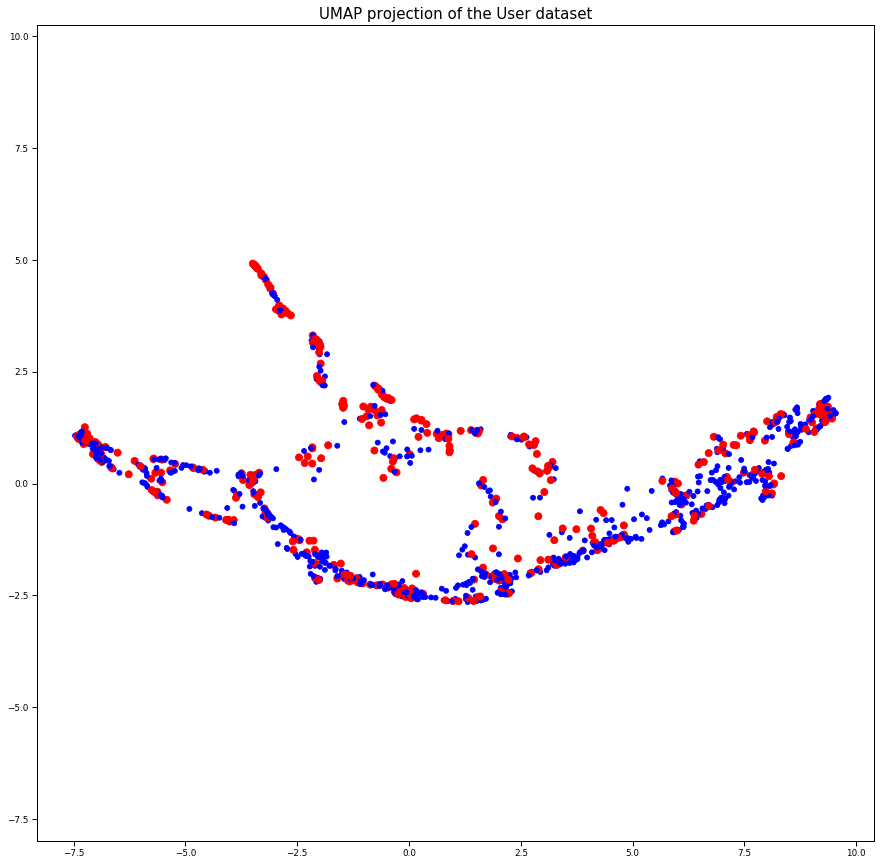

In [25]:
cols, size = plt_color(y_train)
plt.figure(figsize=(15,15))
plt.scatter(embedding[:, 0], embedding[:, 1], c=cols, s=size)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the User dataset', fontsize=15);

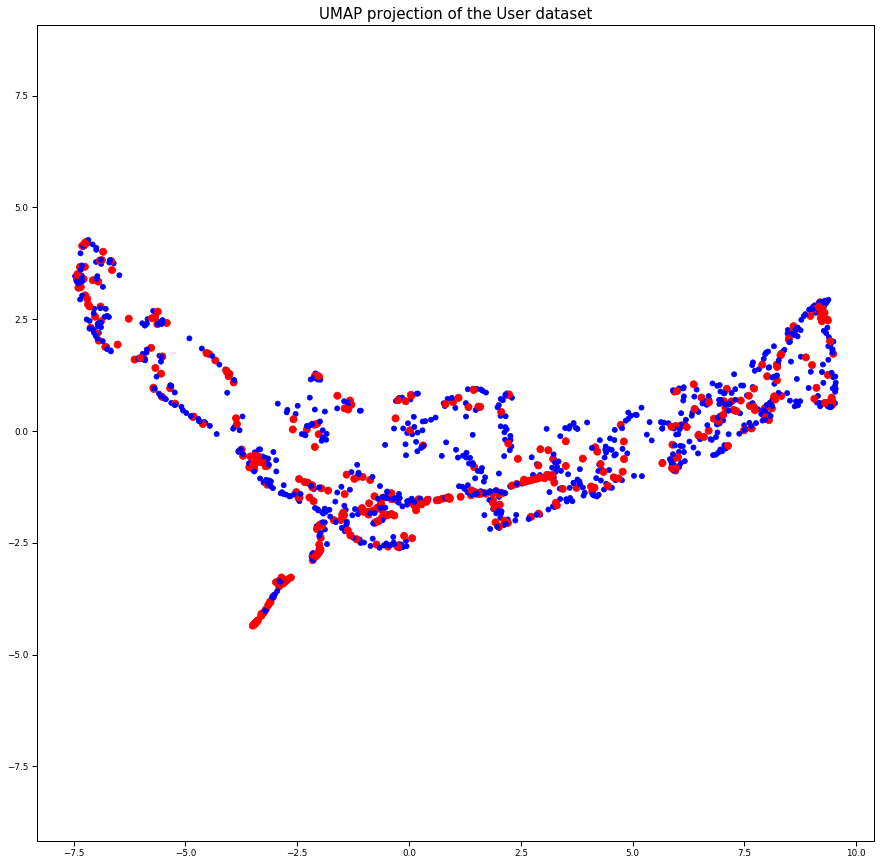

In [26]:
cols, size = plt_color(y_train)
plt.figure(figsize=(15,15))
plt.scatter(embedding[:, 0], embedding[:, 2], c=cols, s=size)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the User dataset', fontsize=15);

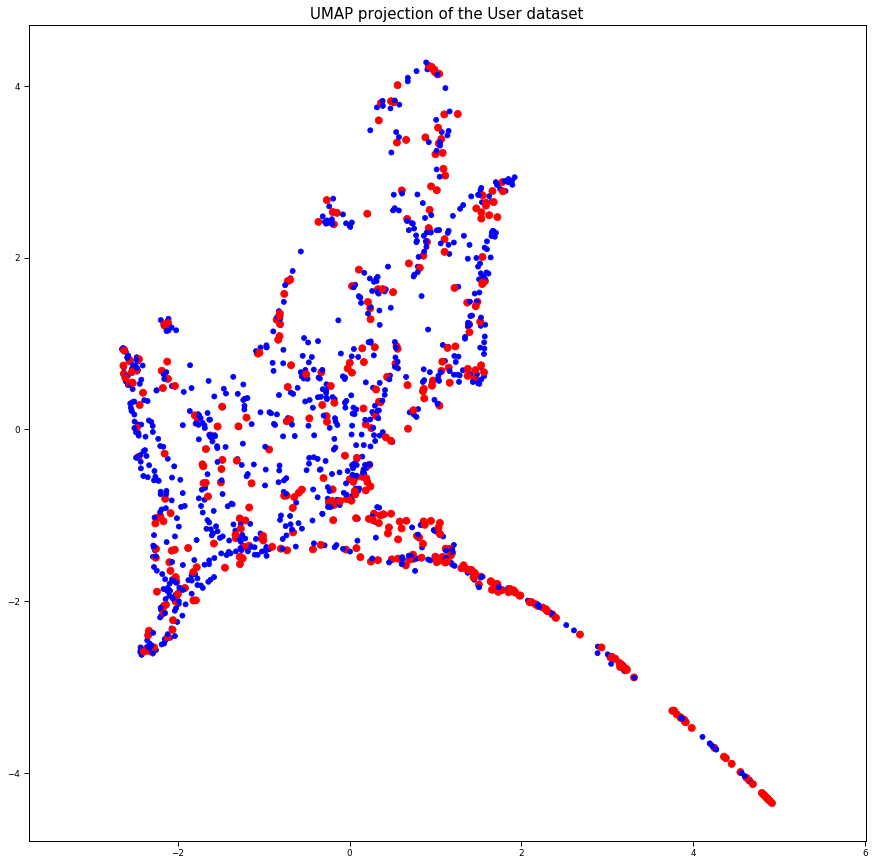

In [27]:
cols, size = plt_color(y_train)
plt.figure(figsize=(15,15))
plt.scatter(embedding[:, 1], embedding[:, 2], c=cols, s=size)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the User dataset', fontsize=15);

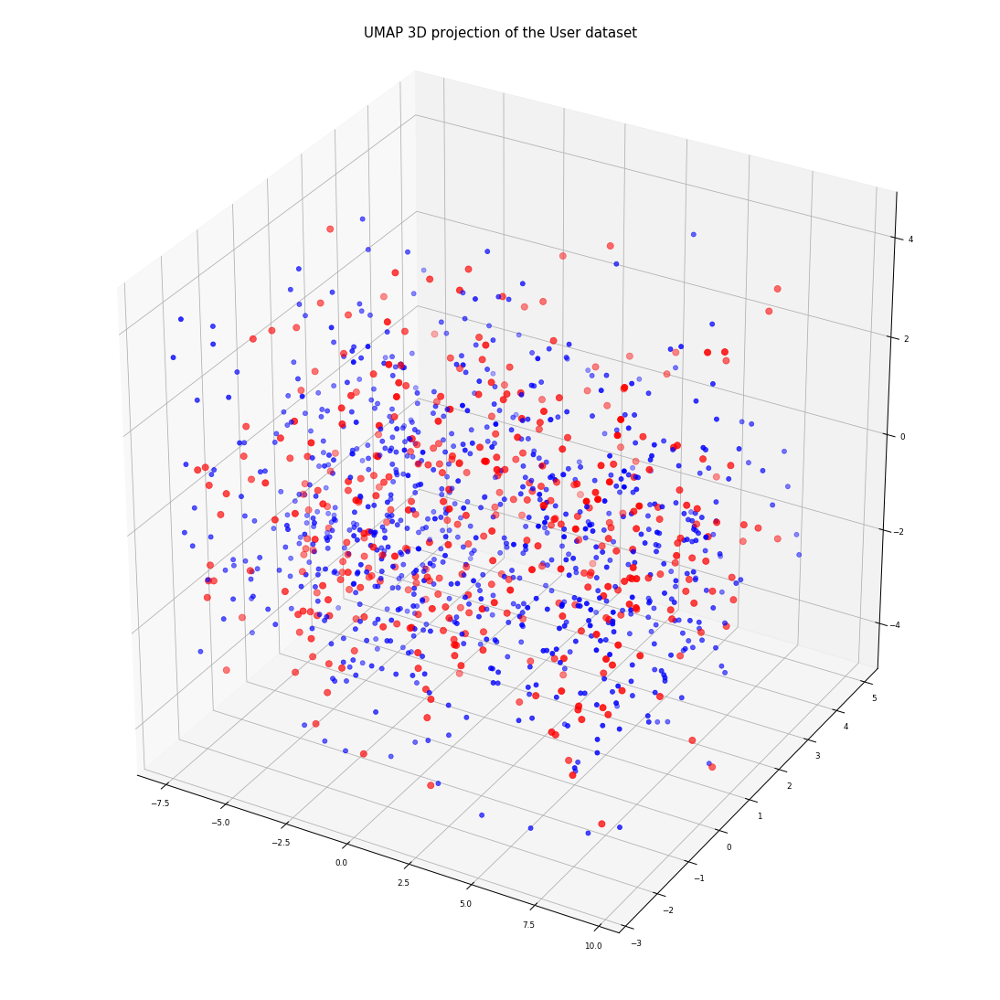

In [39]:
fig = plt.figure(figsize=(15,15))
ax = Axes3D(fig)
ax.scatter(embedding[:, 0], embedding[:, 1], embedding[:, 2], c=cols, s=size)
plt.suptitle('UMAP 3D projection of the User dataset', fontsize=15);

---

### UMAP enhanced clustering

In [64]:
def plot_UMAP_3D(X_train, n_neighbors, min_dist, save=False):

    clusterable_embedding = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=3,
        random_state=42,
    ).fit_transform(X_train)

    cols, size = plt_color(y_train)
    fig = plt.figure(figsize=(15, 15))
    ax = Axes3D(fig)
    ax.scatter(clusterable_embedding[:, 0],
               clusterable_embedding[:, 1],
               clusterable_embedding[:, 2],
               c=cols,
               s=size)
    plt.suptitle('3D UMAP Projection Mid-High-Freq- n_neighbors=' +
                 str(n_neighbors) + ' - min_dist=' + str(min_dist),
                 fontsize=15)
    if save:
        plt.savefig('../images/3D_UMAP-Susp_User_Dataset_Result_n_neighbors=' +
                    str(n_neighbors) + '_min_dist=' + str(min_dist),
                    bbox_inches='tight')
    return clusterable_embedding

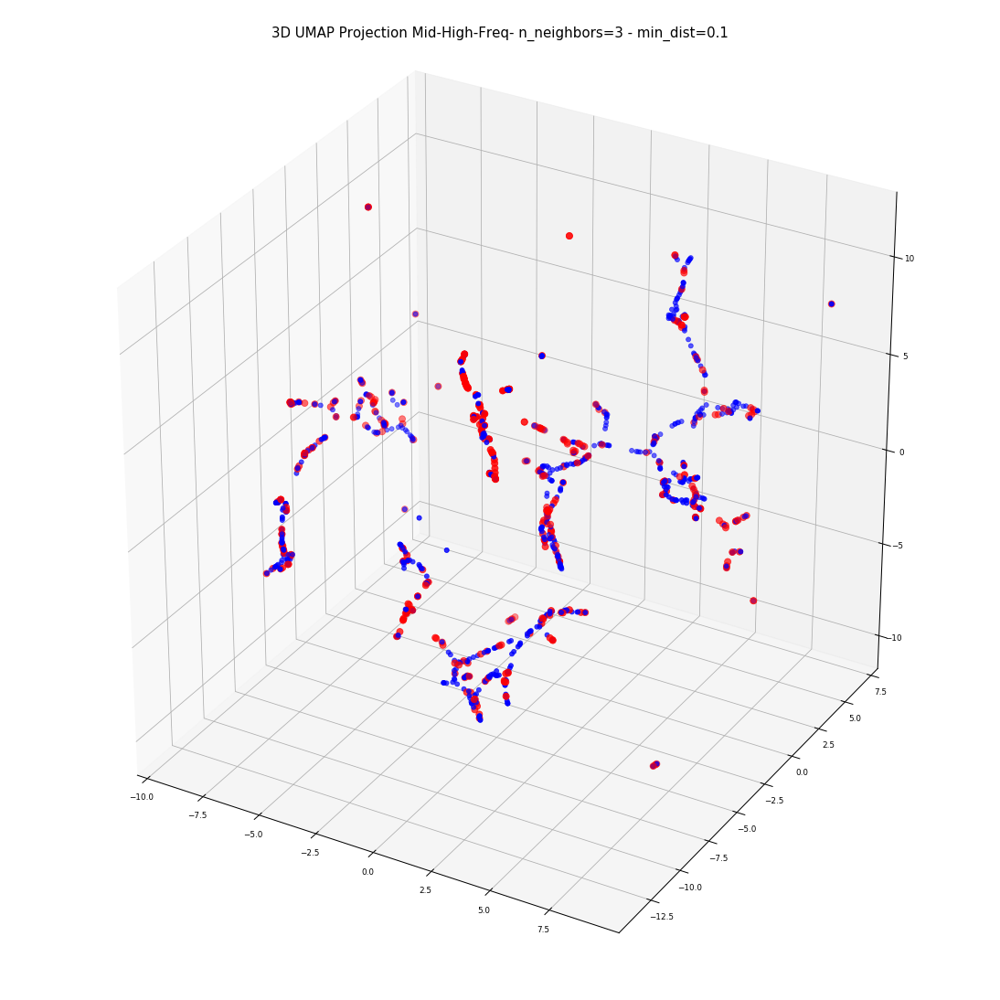

In [65]:
n_neighbors=3
min_dist=0.1
clusterable_embedding = plot_UMAP_3D(X_train, n_neighbors, min_dist, save=False)

In [66]:
clusterable_embedding

array([[ -2.8140903 ,   4.594933  ,  -1.5627642 ],
       [  3.152328  ,  -7.1495595 ,   1.0680522 ],
       [ -1.076452  , -10.565388  ,   0.9791027 ],
       ...,
       [  7.2847614 ,   2.7851598 ,   3.807808  ],
       [  1.2131094 ,  -1.3868634 ,   2.3076866 ],
       [  6.2930126 ,  -0.65440357,   0.6383062 ]], dtype=float32)

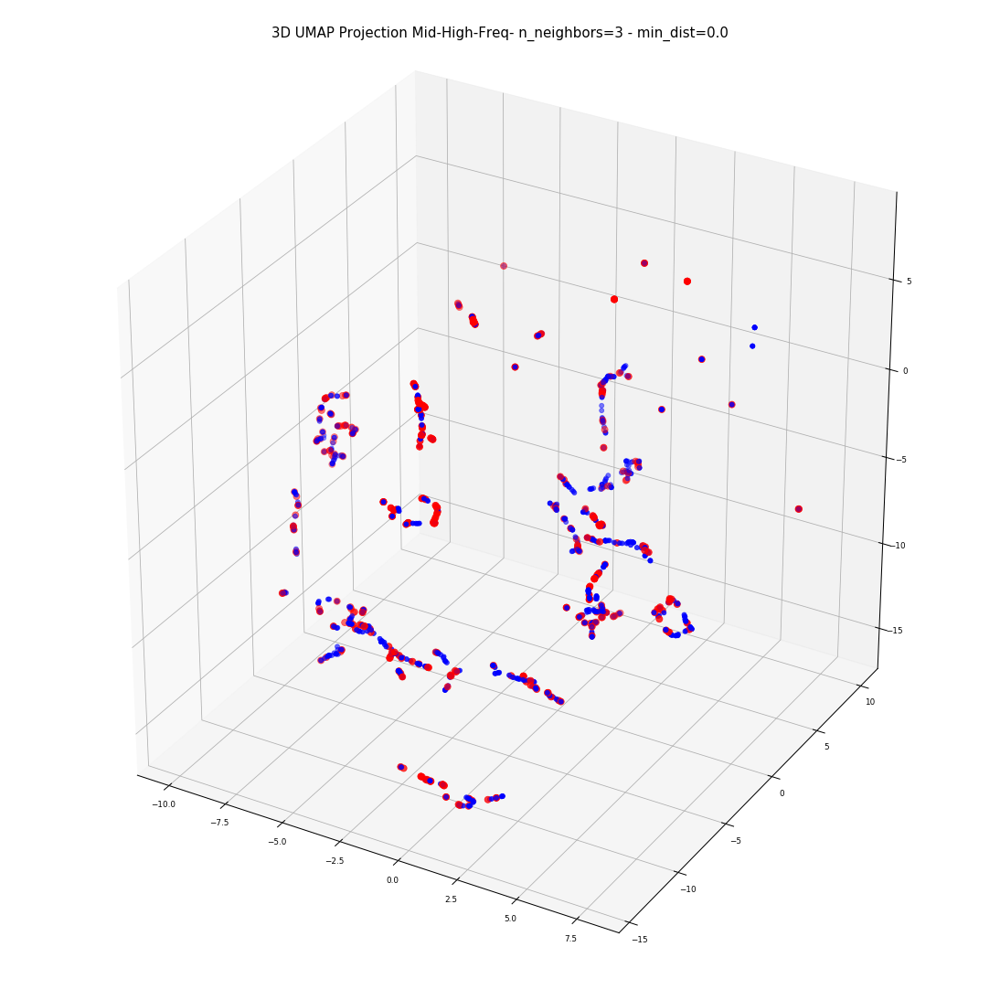

In [67]:
n_neighbors=3
min_dist=0.0
clusterable_embedding_3 = plot_UMAP_3D(X_train, n_neighbors, min_dist, save=False)

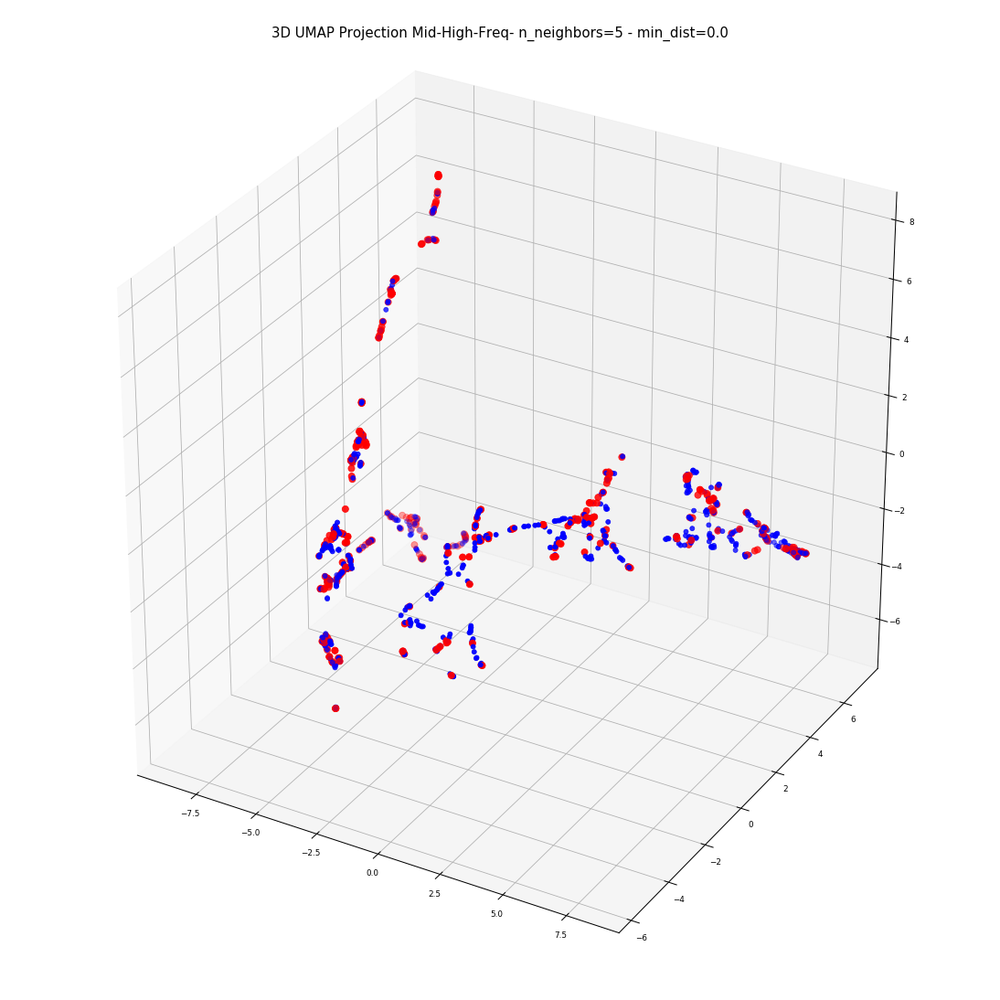

In [68]:
n_neighbors=5
min_dist=0.0
clusterable_embedding_5 = plot_UMAP_3D(X_train, n_neighbors, min_dist, save=False)

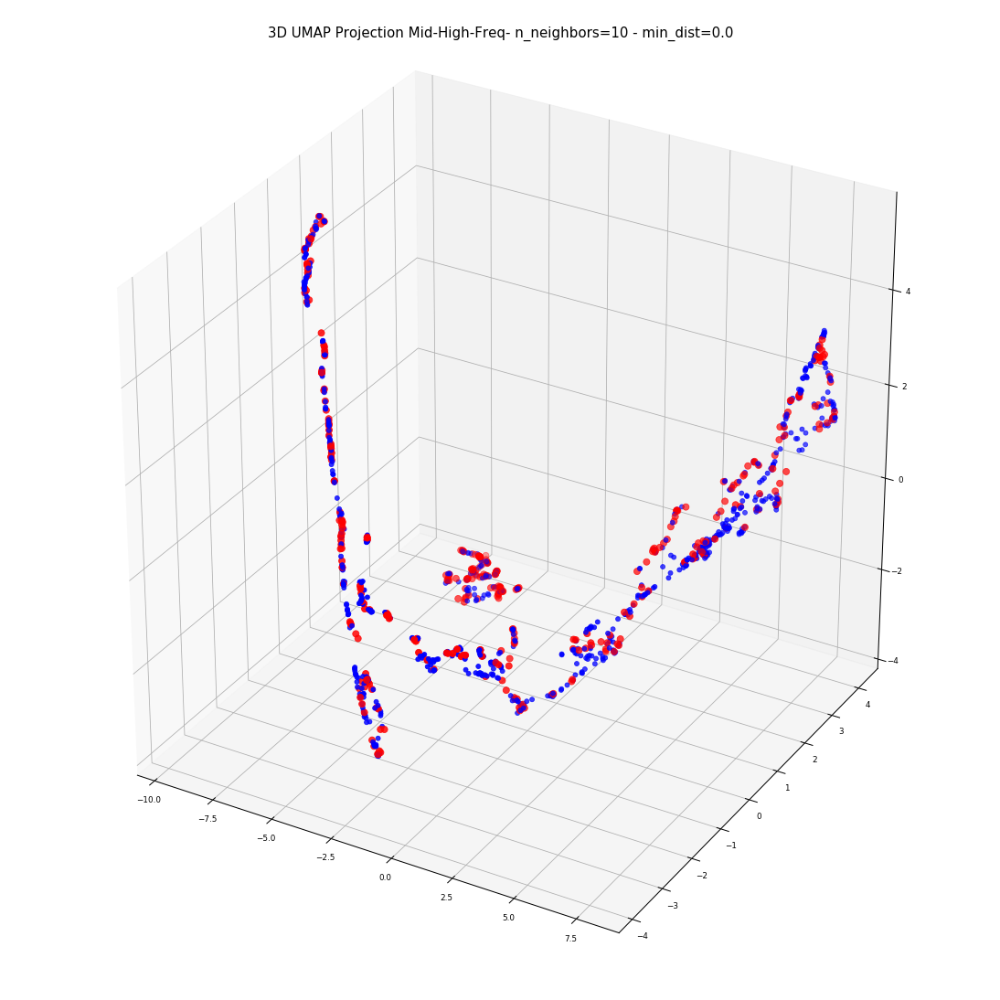

In [69]:
n_neighbors=10
min_dist=0.0
clusterable_embedding_10 = plot_UMAP_3D(X_train, n_neighbors, min_dist, save=False)

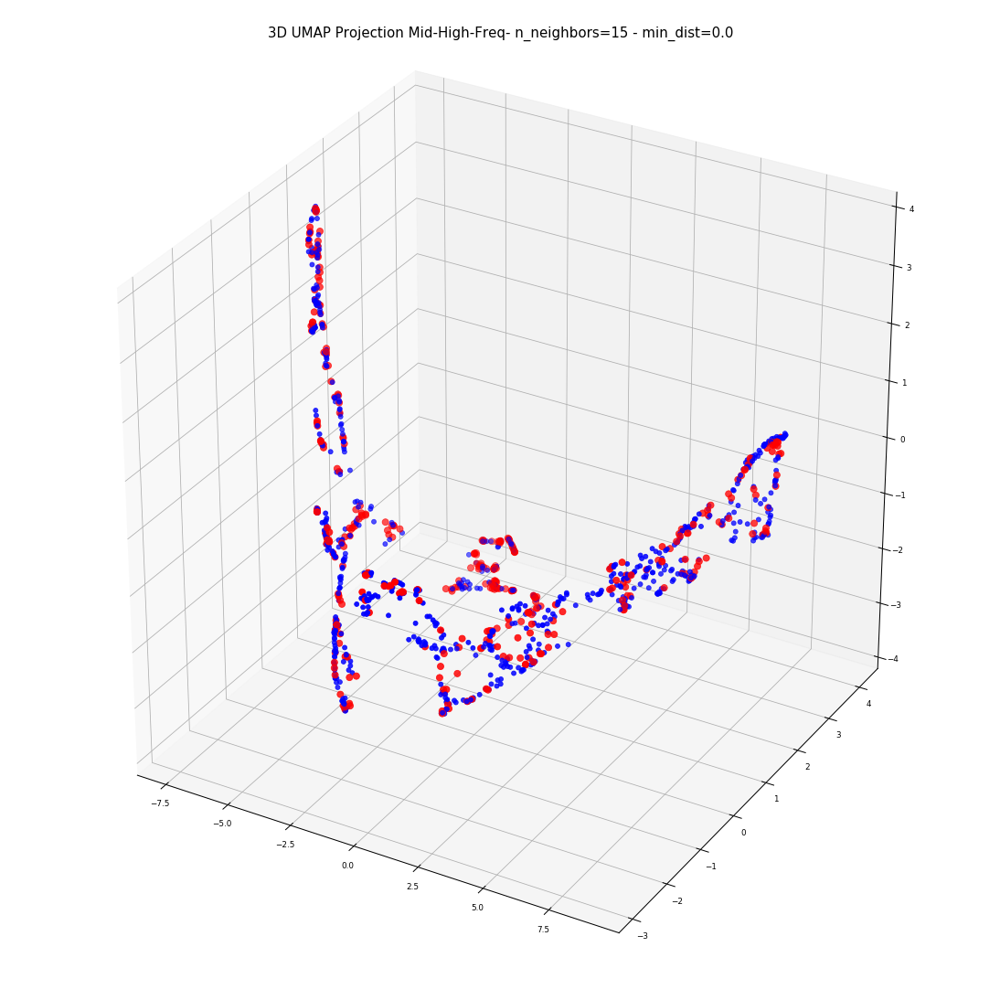

In [70]:
n_neighbors=15
min_dist=0.0
clusterable_embedding_15 = plot_UMAP_3D(X_train, n_neighbors, min_dist, save=False)

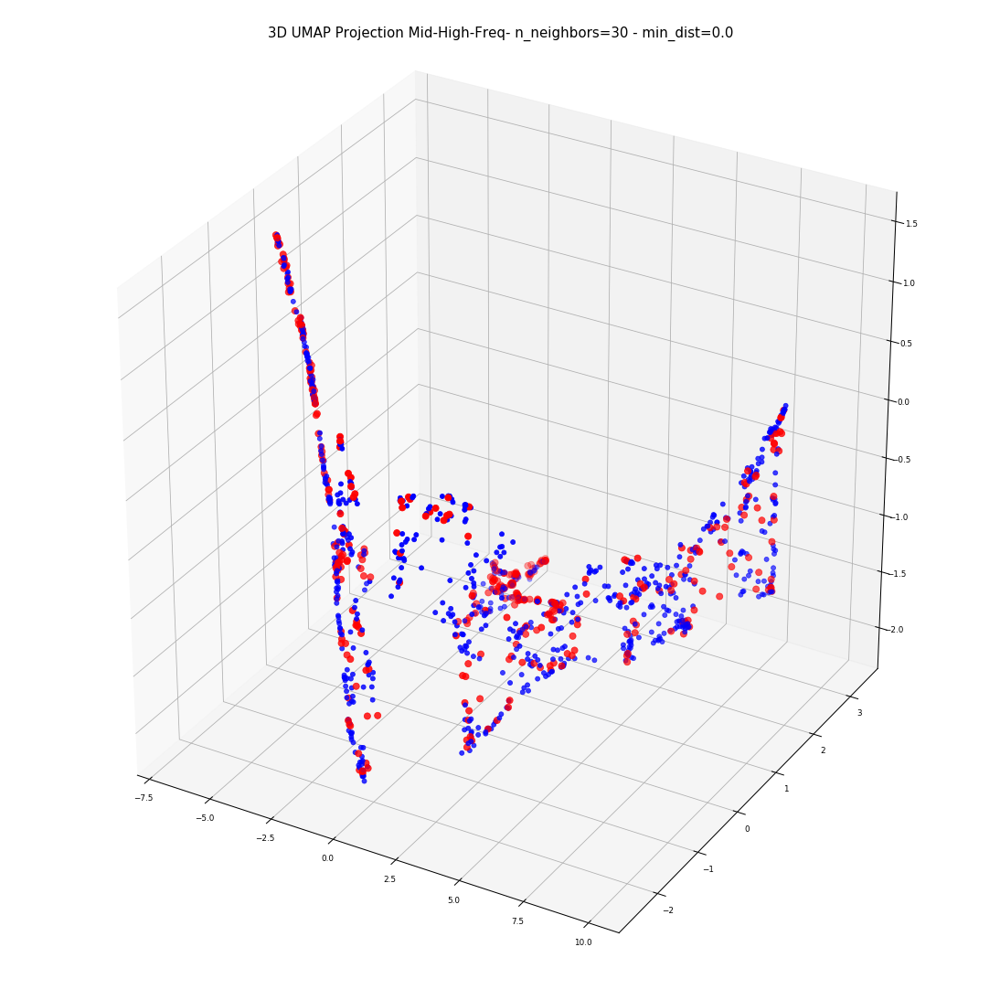

In [71]:
n_neighbors=30
min_dist=0.0
clusterable_embedding_30 = plot_UMAP_3D(X_train, n_neighbors, min_dist, save=False)

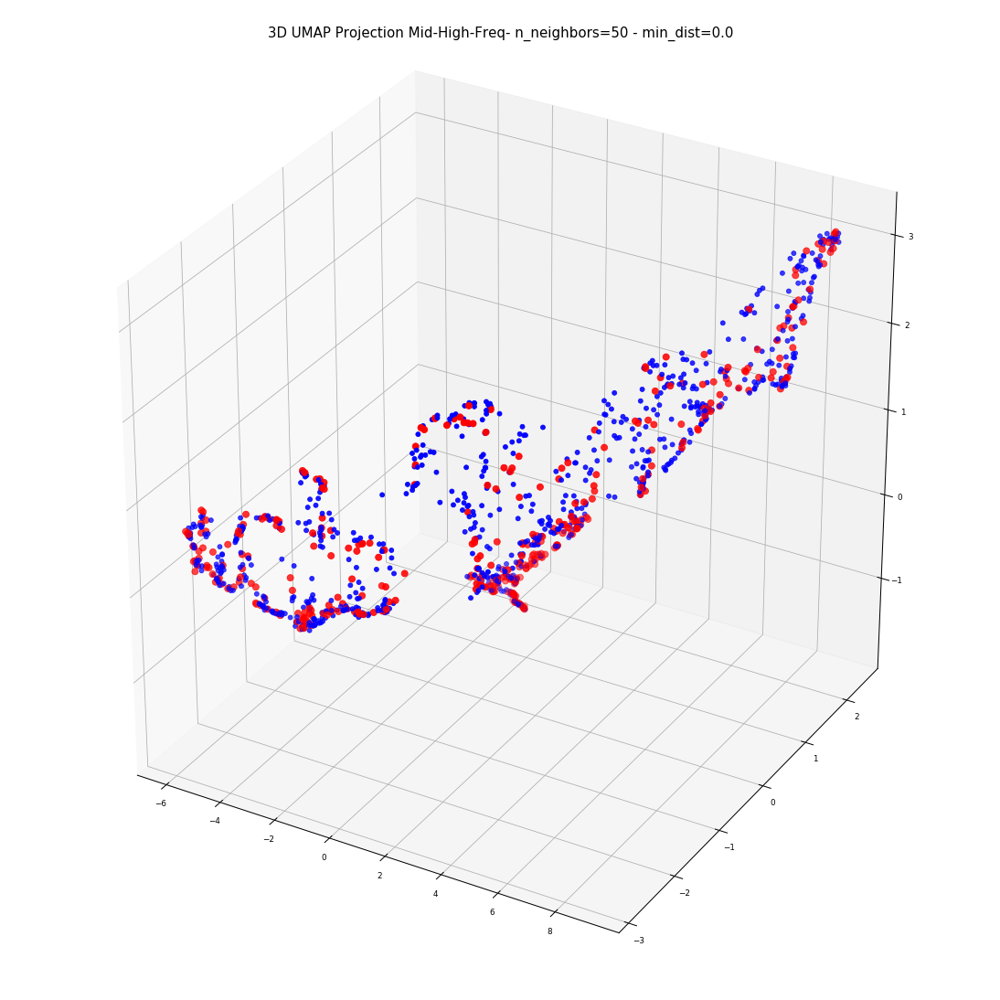

In [72]:
n_neighbors=50
min_dist=0.0
clusterable_embedding_50 = plot_UMAP_3D(X_train, n_neighbors, min_dist, save=False)

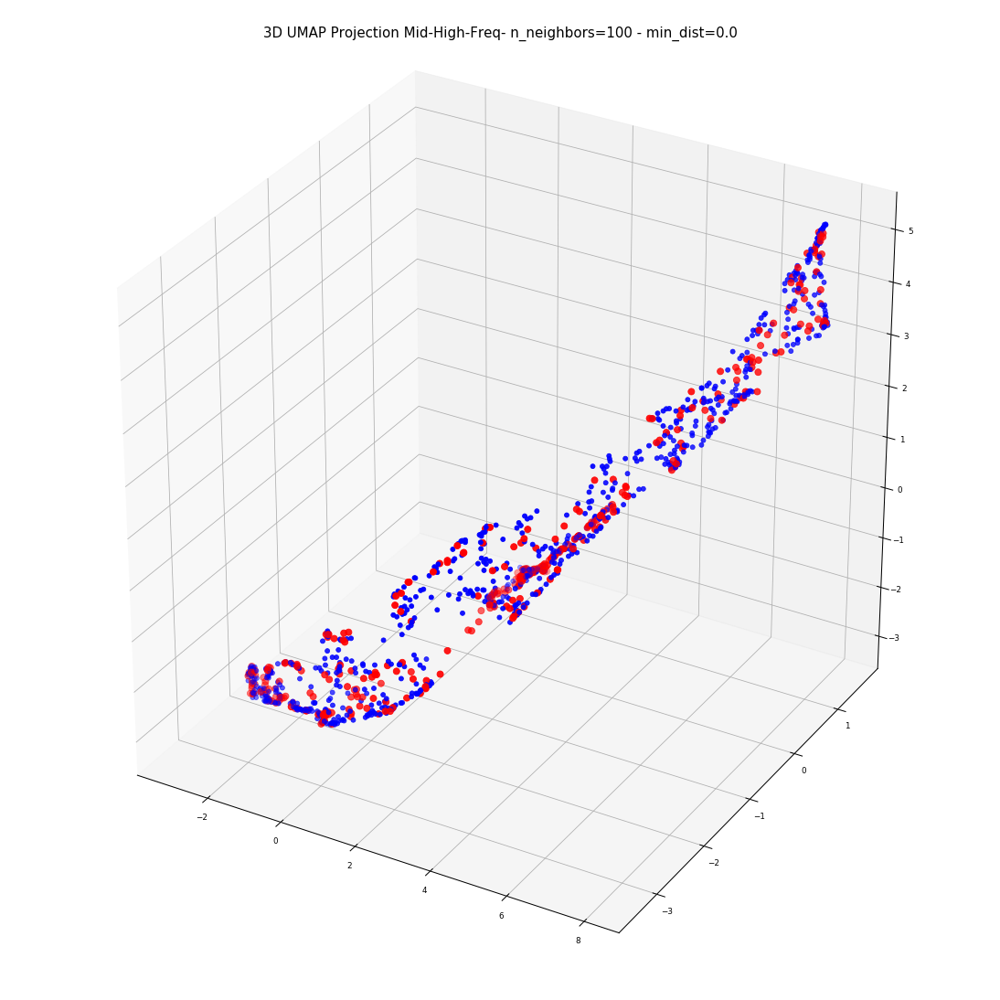

In [73]:
n_neighbors=100
min_dist=0.0
clusterable_embedding_100 = plot_UMAP_3D(X_train, n_neighbors, min_dist, save=False)

## Manipulation 3D with Plotly

In [89]:
def Interactive_3D_UMAP(clusterable_embedding):
    trace = go.Scatter3d(
        x = clusterable_embedding[:, 0],
        y = clusterable_embedding[:, 1],
        z = clusterable_embedding[:, 2],
        mode='markers',
        marker={
            'size': 5,
            'opacity': 0.5,
            'color':'red'
        }
    )

    layout = go.Layout(
        margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
    )
    data = [trace]
    plot_figure = go.Figure(data=data, layout=layout)

    plotly.offline.iplot(plot_figure)

In [185]:
Interactive_3D_UMAP(clusterable_embedding_5)

In [187]:
Interactive_3D_UMAP(clusterable_embedding_10)

In [93]:
Interactive_3D_UMAP(clusterable_embedding_100)

## Creating and exploration: Dataframe with 3D and 2D data

Working with:
- n_neighbors = 5
- min_dist = 0.0

In [95]:
user_df = pd.DataFrame(clusterable_embedding_5, columns=('x', 'y', 'z'))

In [96]:
user_df.head()

,x,y,z
0,-6,5,8
1,1,-3,2
2,-6,-1,-3
3,-7,7,-7
4,-4,-2,3


In [106]:
user_df = pd.concat([data.reset_index(), user_df], axis=1)

In [107]:
user_df.head(2)

,user,default_prof_image,acc_verif,local_bol,default_profile,descr_bol,active_acc,tws_cnt,frs_cnt,fols_cnt,...,user_name_len,name_len,user_name_len_num,simil_name,descr_len,fols_frs_ratio,label,x,y,z
0,T13,0,1,1,0,1,1,395044,111381,2837484,...,3,6,2,33,86,25,high_freq,-6,5,8
1,corrupcionchile,0,0,1,0,1,1,14235,9472,11737,...,15,16,0,100,98,1,high_freq,1,-3,2


In [156]:
user_df.head()

,user,default_prof_image,acc_verif,local_bol,default_profile,descr_bol,active_acc,tws_cnt,frs_cnt,fols_cnt,...,user_name_len,name_len,user_name_len_num,simil_name,descr_len,fols_frs_ratio,label,x,y,z
0,T13,0,1,1,0,1,1,395044,111381,2837484,...,3,6,2,33,86,25,high_freq,-6,5,8
1,corrupcionchile,0,0,1,0,1,1,14235,9472,11737,...,15,16,0,100,98,1,high_freq,1,-3,2
2,abalosfelipe,0,0,1,0,1,1,87110,3086,8431,...,12,13,0,100,144,3,high_freq,-6,-1,-3
3,El_Exorcista_,0,0,1,0,1,1,304144,17563,20005,...,13,19,0,69,52,1,high_freq,-7,7,-7
4,nmonckeberg,0,0,1,0,1,1,2409,338,38908,...,11,18,0,75,59,115,high_freq,-4,-2,3


### Exploring 3D

In [218]:
def explore_Umap_3D(user_df,
                    list_users,
                    showbackground=True,
                    showticklabels=True):
    
    user_data = user_df.apply(add_color_size, axis=1)
    fig = go.Figure(data=[
        go.Scatter3d(x=user_data.x,
                     y=user_data.y,
                     z=user_data.z,
                     mode='markers',
                     text = 'User: @'+ user_data['user'],
                     hoverinfo='text+x+y+z',
                     marker=dict(color=user_data.color,
                                 sizemode='diameter',
                                 sizeref=1,
                                 size=5,
                                 opacity=0.7))
    ])
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0),
                      scene=dict(xaxis=dict(showbackground=showbackground,
                                            showticklabels=showticklabels),
                                 yaxis=dict(showbackground=showbackground,
                                            showticklabels=showticklabels),
                                 zaxis=dict(showbackground=showbackground,
                                            showticklabels=showticklabels)))
    plotly.offline.plot(fig, filename='mid-high-freq_user_UMAP_3D.html', auto_open=False)
    fig.show()

In [206]:
def add_color_size(row): 
    if row['user'] in list_users:
        color = 'red'
        size = 10
    elif row['acc_verif']:
        color = 'yellow'
        size = 5
    else:
        color = 'blue'
        size = 3
        
    row['color'] = color
    row['size'] = size

    return row

In [219]:
list_users = [
    'fedoraletelier', 'Aliciacarafipl3', 'Dolores09072598', 
    'AlbertoMayol','Tomaskovacic', 'NelsonCL28',
    'EncuestaExpress', 'RResponsablecl', 'cazadorandino90', 
    'Piagutierrezs','NathalySeplved3', 'ElCentinelaMPE', 
    'AShumman', 'PamelaSoler3','Sumate_Guillier', 'jav_ast'
]
explore_Umap_3D(user_df, list_users)

### Exploring 2D

In [189]:
def explore_Umap_2D(user_df, list_users, x='x', y='y'):
    user_df = user_df.apply(add_color_size, axis=1)
    datasource = ColumnDataSource(user_df)

    p = figure(title='2D UMAP projection (' + x + ',' + y +
               ') of the User dataset',
               plot_width=800,
               plot_height=800,
               tools=('crosshair, pan, wheel_zoom, reset, save, box_select'))
    p.xaxis.axis_label = x.upper()
    p.yaxis.axis_label = y.upper()

    p.add_tools(
        HoverTool(tooltips=[("user", "@user"), (
            "(x,y)",
            "($x, $y)"), ("acc_verif",
                          "@acc_verif"), ("fols_frs_ratio",
                                          "@fols_frs_ratio")]))
    p.circle(x,
             y,
             source=datasource,
             color='color',
             size='size',
             fill_alpha=0.6)

    show(p)

In [117]:
list_users = []
explore_Umap_2D(user_df, list_users, 'x', 'y')

### Verifying Simple Bots

In [196]:
list_users = ['fedoraletelier', 'Aliciacarafipl3', 'Dolores09072598']
explore_Umap_2D(user_df, list_users, 'x', 'y')
explore_Umap_2D(user_df, list_users, 'x', 'z')
explore_Umap_2D(user_df, list_users, 'y', 'z')

### Verifying Top High-Frequency users

In [195]:
list_users = ['AlbertoMayol','Tomaskovacic', 'NelsonCL28']
explore_Umap_2D(user_df, list_users, 'x', 'y')
explore_Umap_2D(user_df, list_users, 'x', 'z')
explore_Umap_2D(user_df, list_users, 'y', 'z')

### Verifying bot suspicius new users 

In [194]:
list_users = [
    'EncuestaExpress', 'RResponsablecl', 'cazadorandino90', 'Piagutierrezs',
    'NathalySeplved3', 'ElCentinelaMPE', 'AShumman', 'PamelaSoler3',
    'Sumate_Guillier', 'jav_ast'
]

explore_Umap_2D(user_df, list_users, 'x', 'y')
explore_Umap_2D(user_df, list_users, 'x', 'z')
explore_Umap_2D(user_df, list_users, 'y', 'z')